# MBTI Predictor 5000

In [1]:
import pandas as pd
import re
import html
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from bs4 import BeautifulSoup
from tqdm import tqdm
import math
import preprocessor as p
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from nltk.probability import FreqDist
from wordcloud import WordCloud
tqdm.pandas(desc="df")
stop_words = set(stopwords.words('english'))

In [2]:
original_df = pd.read_csv('4mil.csv')

/Users/cadyli/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (0,1,2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
#remove null values
df = original_df[original_df['author'].notna()].copy()
df.sort_values(by=["author"])

,flair_text,body,subreddit,author
1471899,ISTP: The Analyzer,How did you know? ;p,istp,---MrTONY---
2336106,ISTP: The Analyzer,STOP being GAY. No1 likes karma hoes,drunk,---MrTONY---
2029868,ISTP: The Analyzer,I think so,nihilism,---MrTONY---
2024945,ISTP: The Analyzer,The one with the crazy legs?,drunk,---MrTONY---
2288779,ISTP: The Analyzer,Edgy gay lord,drunk,---MrTONY---
...,...,...,...,...
1462319,INTJ: The Mastermind,Add never get married and that's some solid ad...,personalfinance,zylo_
2469223,INTJ: The Mastermind,"Way to victim blame, shitlord.\n\nEDIT: That w...",atheism,zylo_
1577557,INTJ: The Mastermind,"Maybe instead of adding buttons, simply change...",CivClicker,zylo_
1769818,INTJ: The Mastermind,"Actually, it matters more. The more money you...",todayilearned,zylo_


# MBTI Value Analysis per Author

In [4]:
#extract all MBTI values per author
df['MBTI'] = df.progress_apply(lambda row: re.search("[IiEe][SsNn][FfTt][PpJj]",row.flair_text)[0].upper(), axis=1)
df['MBTIs'] = df.progress_apply(lambda row: re.findall("[IiEe][SsNn][FfTt][PpJj]",row.flair_text), axis=1)
df['MBTI Count'] = df['MBTIs'].str.len()
df

df: 100%|██████████| 2264121/2264121 [00:20<00:00, 110833.50it/s]


,flair_text,body,subreddit,author,MBTI,MBTIs,MBTI Count
0,INFP: The Dreamer Senpai,Lol that's why I left.,entp,LadyBanterbury,INFP,[INFP],1
1,INTP: The Theorist,"I was just about to post ""I try telling people...",INTP,Finarin,INTP,[INTP],1
2,INFP: The Dreamer,My first thought was Pepsi or something. Proba...,WTF,xanplease,INFP,[INFP],1
3,"ENTP: Antisocial Extrovert, Rational Eccentric","Not if the formula is something like ""every ti...",youtubehaiku,HeirToGallifrey,ENTP,[ENTP],1
4,INTP/18/m/blankly staring at you,Does this imply I'm a five now?,entp,lightfive,INTP,[INTP],1
...,...,...,...,...,...,...,...
4077454,[INFP],I think most if not all youngsters know how co...,singapore,MinisterforFun,INFP,[INFP],1
4077455,INFJ M34,Sweet! I'm glad you were able to wrangle that ...,infj,Fenzir,INFJ,[INFJ],1
4077456,INTP 7w6 - 3w4 - 9w1,Reminds me of Ontario Mills Mall back in the d...,90sdesign,srdyuop,INTP,[INTP],1
4077457,ISTJ: The Postulatician,"The Near East, Afrasia, the Arctic Circle, Sca...",worldbuilding,millenmar,ISTJ,[ISTJ],1


<AxesSubplot:xlabel='MBTI Count', ylabel='count'>

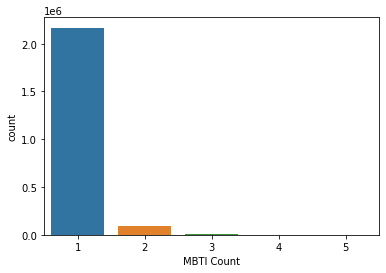

In [5]:
sns.countplot(x = 'MBTI Count', data = df)

There are authors with more than 1 MBTI personality, which is inaccurate data that we will ignore for our model training. This may be due to a change in personality over time or a mistake in identification during registration by the user.

In [6]:
#remove all authors who have multiple MBTI personalities
author_to_remove = df[df['MBTIs'].str.len() > 1]['author'].tolist()
df1 = df[~df['author'].isin(author_to_remove)].copy()
print(f'There are {len(author_to_remove)} authors we need to remove')

There are 97238 authors we need to remove


In [7]:
#drop all null values and extra columns
df1.drop(columns=['flair_text','subreddit','MBTIs','author','MBTI Count'], inplace=True)
df1 = df1.dropna()
df1

,body,MBTI
0,Lol that's why I left.,INFP
1,"I was just about to post ""I try telling people...",INTP
2,My first thought was Pepsi or something. Proba...,INFP
3,"Not if the formula is something like ""every ti...",ENTP
5,"Well, I wouldn't know but I think there's a lo...",INTP
...,...,...
4077453,Over 8 years! Amazing. I just lost my boy Toas...,INFP
4077454,I think most if not all youngsters know how co...,INFP
4077455,Sweet! I'm glad you were able to wrangle that ...,INFJ
4077456,Reminds me of Ontario Mills Mall back in the d...,INTP


# Comments analysis

In [8]:
#narrow down dataframe to comments with more than 20 lengths to narrow down to more contextual and accurate data
short_df = df1[df1['body'].str.count(' ')>20].copy()
short_df

,body,MBTI
1,"I was just about to post ""I try telling people...",INTP
5,"Well, I wouldn't know but I think there's a lo...",INTP
12,I just want a NES Classic Controller since I a...,INFJ
13,"maybe you were being tongue in cheek, but you ...",ENTP
14,I agree that the consistant position is to sup...,INFP
...,...,...
4077450,"For starters, read the Bearding Guides in the ...",INTP
4077451,Old Crown yielded many of the best fights back...,INTP
4077454,I think most if not all youngsters know how co...,INFP
4077455,Sweet! I'm glad you were able to wrangle that ...,INFJ


In [9]:
def preprocess_text(sentence):
    #clean sentence using built in preprocessor
    sentence = str(sentence)
    sentence = p.clean(sentence)
    #tokenize word and remove stop words
    word_tokens = word_tokenize(sentence)
    sentence = [w for w in word_tokens if not w.lower() in stop_words]
    sentence = [x for x in sentence if "'" not in x]
    sentence = ' '.join(sentence)
    # Removing multiple spaces and line breaks
    sentence = re.sub(r"\s+", " ", sentence)
    sentence = sentence.strip()
    sentence = sentence.replace('\n',' ')
    return sentence

In [10]:
short_df['clean'] = short_df['body'].progress_apply(lambda x:preprocess_text(x))

df: 100%|██████████| 884998/884998 [09:56<00:00, 1482.85it/s]


# Word length analysis

In [11]:
short_df['word_count'] = short_df['clean'].progress_apply(lambda x: len(str(x).split()))
short_df['word_count'].describe()

df: 100%|██████████| 884998/884998 [00:02<00:00, 366563.25it/s]


count    884998.000000
mean         46.785613
std          59.630949
min           0.000000
25%          19.000000
50%          29.000000
75%          51.000000
max        5485.000000
Name: word_count, dtype: float64

On average, a comment has 46 words with some having up to 5485 words and some with none. This is a wide range of lengths per comment that needs to be narrowed down and normalized for most efficient training of the model. We can perform further analysis on outliers to get the optimal comment range to work on.

In [12]:
# finding outliers for word counts using inter quartile range method
no_of_outliers = [ ]
clean = []

arr = short_df['word_count']
# finding the 1st quartile
q1 = np.quantile(arr, 0.25)

# finding the 3rd quartile
q3 = np.quantile(arr, 0.75)
med = np.median(arr)

# finding the iqr region
iqr = q3-q1
print('iqr:\t\t',iqr)

# finding upper and lower whiskers
upper_bound = q3+(1.5*iqr)
lower_bound = q1-(1.5*iqr)
print('upper bound:\t',upper_bound)
print('lower bound:\t',lower_bound)
outliers = arr[(arr <= lower_bound) | (arr >= upper_bound)]

iqr:		 32.0
upper bound:	 99.0
lower bound:	 -29.0


In [13]:
countdf = short_df.loc[(short_df['word_count'] > lower_bound) & (short_df['word_count']< upper_bound)].copy()
countdf

,body,MBTI,clean,word_count
1,"I was just about to post ""I try telling people...",INTP,post `` try telling people time always joking ...,22
5,"Well, I wouldn't know but I think there's a lo...",INTP,"Well , would know think lot potential . techno...",35
12,I just want a NES Classic Controller since I a...,INFJ,want NES Classic Controller since already game...,35
13,"maybe you were being tongue in cheek, but you ...",ENTP,"maybe tongue cheek , wreck body enjoy using dr...",19
14,I agree that the consistant position is to sup...,INFP,"agree consistant position support way , think ...",70
...,...,...,...,...
4077449,Trying to find it here: https://en.m.wikipedia...,ENTJ,Trying find : remember details ? Something min...,20
4077450,"For starters, read the Bearding Guides in the ...",INTP,"starters , read Bearding Guides sidebar /r/bea...",51
4077454,I think most if not all youngsters know how co...,INFP,think youngsters know competitive performing a...,40
4077455,Sweet! I'm glad you were able to wrangle that ...,INFJ,Sweet ! glad able wrangle Fe include among peo...,22


<AxesSubplot:xlabel='word_count', ylabel='Count'>

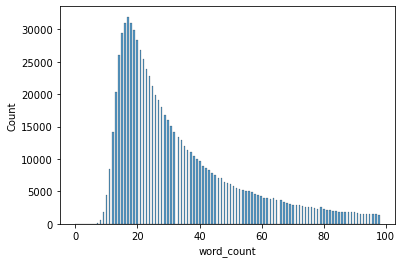

In [14]:
sns.histplot(data=countdf['word_count'])

Upon removing outliers, we find that most comments are around 20 words long with 20-30 being an optimal range to select as most comments fall within this range (around 75%) and the rest can be deemed as outliers and removed.

In [15]:
#narrow down dataframe to comments with 20-30 words based on word count analysis
short_df2 = short_df[short_df['clean'].str.count(' ').between(20,30)].copy()

In [16]:
short_df2['numConcat'] = 1
short_df2

,body,MBTI,clean,word_count,numConcat
1,"I was just about to post ""I try telling people...",INTP,post `` try telling people time always joking ...,22,1
16,Its kind of strange how they will lump very va...,INTJ,kind strange lump vague references religions o...,23,1
27,I helped some friends of mine purchase two Hon...,INTP,helped friends mine purchase two Honda Civic S...,27,1
32,"I do too, but can one come back from it all? H...",INTJ,", one come back ? , indeed , need meds , chang...",28,1
41,He promised to fuck the climate in his campaig...,ISTP,promised fuck climate campaign . promises fuck...,24,1
...,...,...,...,...,...
4077407,The great part about the program is you techni...,ENFP,great part program technically worry since eve...,22,1
4077421,That's a nice upgrade. I have the same model o...,INFP,nice upgrade . model logic board dead . resurr...,22,1
4077430,You're right. People who think atheism is trut...,INFP,right . People think atheism truth mistaken pe...,26,1
4077447,"It is in the middle of a series, but Garment o...",ENFJ,"middle series , Garment Shadows Laurie R. King...",25,1


# MBTI distribution analysis

In [17]:
allCounts = short_df2['MBTI'].value_counts()
allCountsDic = allCounts.to_dict()
minKey = min(allCountsDic, key=allCountsDic.get)

In [18]:
short_df2['E/I'] = short_df2.progress_apply(lambda row: row.MBTI[0], axis=1)
short_df2['N/S'] = short_df2.progress_apply(lambda row: row.MBTI[1], axis=1)
short_df2['F/T'] = short_df2.progress_apply(lambda row: row.MBTI[2], axis=1)
short_df2['P/J'] = short_df2.progress_apply(lambda row: row.MBTI[3], axis=1)

df: 100%|██████████| 224927/224927 [00:01<00:00, 140426.57it/s]


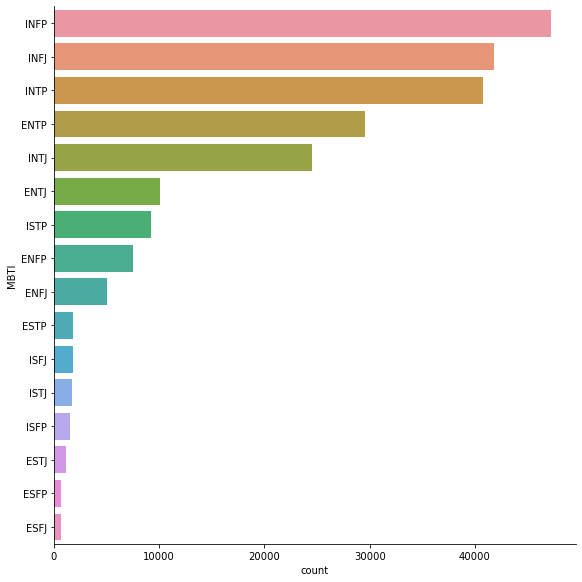

In [19]:
sns.catplot(y = 'MBTI', data = short_df2, kind = "count", height = 8,  order = short_df2['MBTI'].value_counts().index)

We can observe a wide range for all 16 classes with vastly different counts. This may be a problem and may lead to overfitting of the model on the classes with a significantly larger count.

(0.0, 220000.0)

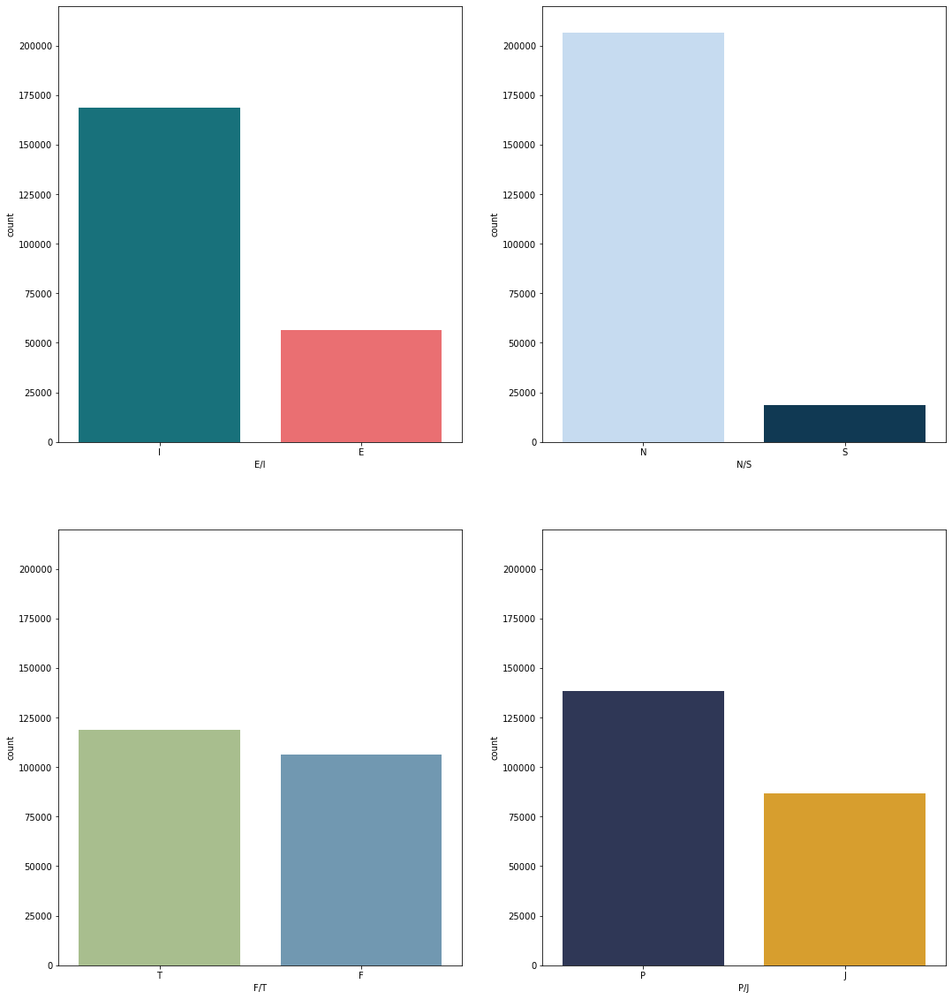

In [20]:
f, ax = plt.subplots(2, 2, figsize=(18, 20))
sns.countplot(x = 'E/I', data = short_df2,ax=ax[0,0],palette=["#087e8b","#FF5A5F"]).set_ylim(0, 220000)
sns.countplot(x = 'N/S', data = short_df2,ax=ax[0,1],palette=["#BFDBF7","#053C5E"]).set_ylim(0, 220000)
sns.countplot(x = 'F/T', data = short_df2,ax=ax[1,0],palette=["#A8C686","#669BBC"]).set_ylim(0, 220000)
sns.countplot(x = 'P/J', data = short_df2,ax=ax[1,1],palette=["#29335C","#F3A712"]).set_ylim(0, 220000)

Even for each classification I vs E, N vs S, F vs T, P vs J - there is a stark difference in counts which may affect training of the model. We can solve this by down sampling classes.

In [21]:
#down sample classes to get similar distributions
distrib = dict(allCounts)

counts = {}
for i in distrib:
    for j in i:
        c = counts.get(j,0)
        counts[j] = c+distrib[i]
ie = counts["I"] - counts["E"]

total = distrib["INTP"] + distrib["INFP"] + distrib["INTJ"] + distrib["INFJ"] +distrib["ISTP"] + distrib["ISFP"] + distrib["ISTJ"] + distrib["ISFJ"]
for i in distrib:
    if i[0] == "I":
        toremove = int(ie*(distrib[i]/total))
        distrib[i] -= toremove
        

counts = {}
for i in distrib:
    for j in i:
        c = counts.get(j,0)
        counts[j] = c+distrib[i]
ns = counts["N"] - counts["S"]

total = distrib["INTP"] + distrib["INFP"] + distrib["INTJ"] + distrib["INFJ"]+ distrib["ENTP"] + distrib["ENFP"] + distrib["ENTJ"] + distrib["ENFJ"] 
for i in distrib:
    if i[1] == "N":
        toremove = int(ns*(distrib[i]/total))
        distrib[i] -= toremove

        
counts = {}
for i in distrib:
    for j in i:
        c = counts.get(j,0)
        counts[j] = c+distrib[i]

ft = counts["T"] - counts["F"]
total = distrib["ENTP"] + distrib["INTP"] + distrib["INTJ"] + distrib["ENTJ"] +distrib["ISTP"] + distrib["ESTP"] + distrib["ISTJ"] + distrib["ESTJ"]
for i in distrib:
    if i[2] == "T":
        toremove = int(ft*(distrib[i]/total))
        distrib[i] -= toremove
        

counts = {}
for i in distrib:
    for j in i:
        c = counts.get(j,0)
        counts[j] = c+distrib[i]

In [22]:
distrib

{'INFP': 1377,
 'INFJ': 1219,
 'INTP': 618,
 'ENTP': 1334,
 'INTJ': 372,
 'ENTJ': 456,
 'ISTP': 1601,
 'ENFP': 652,
 'ENFJ': 440,
 'ESTP': 933,
 'ISFJ': 599,
 'ISTJ': 292,
 'ISFP': 505,
 'ESTJ': 574,
 'ESFP': 714,
 'ESFJ': 670}

In [23]:
total = 0
for i in distrib: 
    total += distrib[i]

print("Need to add:", total)
entries = []
for index, row in tqdm(short_df2.iterrows()):
    if distrib[row['MBTI']] > 0:
        entries.append(list(row))
        distrib[row['MBTI']] -= 1
        total -= 1
    if total == 0:
        break
        
df5 = pd.DataFrame(entries)
df5.columns = list(short_df2.columns)

1583it [00:00, 15829.22it/s]

Need to add: 12356


224884it [00:07, 28442.18it/s]


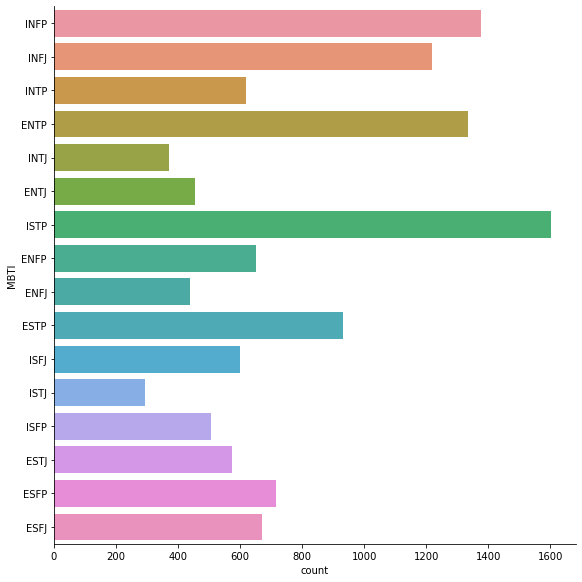

In [24]:
sns.catplot(y = 'MBTI', data = df5, kind = "count", height = 8,  order = short_df2['MBTI'].value_counts().index)

After down sampling, we can observe a much similar count for each class and hence, can train our model more evenly without over-fitting to the majority class.

(0.0, 10000.0)

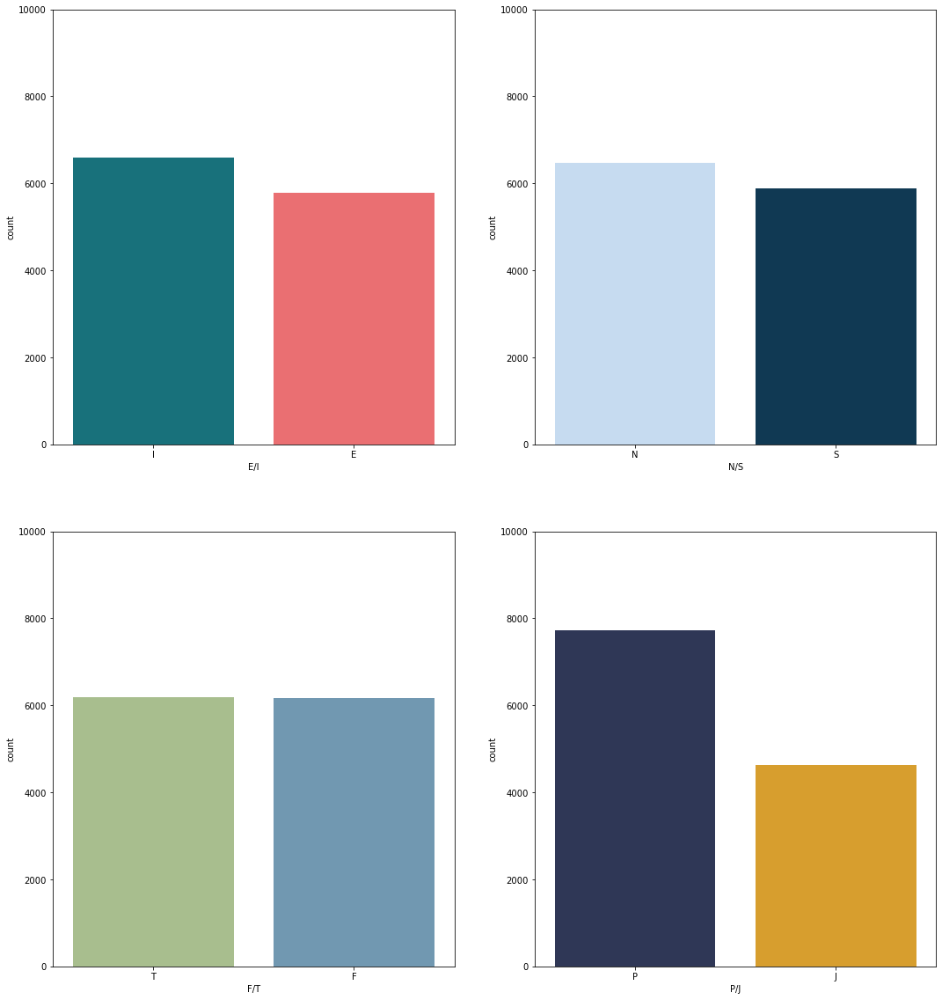

In [25]:
f, ax = plt.subplots(2, 2, figsize=(18, 20))
sns.countplot(x = 'E/I', data = df5,ax=ax[0,0],palette=["#087e8b","#FF5A5F"]).set_ylim(0, 10000)
sns.countplot(x = 'N/S', data = df5,ax=ax[0,1],palette=["#BFDBF7","#053C5E"]).set_ylim(0, 10000)
sns.countplot(x = 'F/T', data = df5,ax=ax[1,0],palette=["#A8C686","#669BBC"]).set_ylim(0, 10000)
sns.countplot(x = 'P/J', data = df5,ax=ax[1,1],palette=["#29335C","#F3A712"]).set_ylim(0, 10000)

In [26]:
final = df5[['MBTI','clean','numConcat']].copy()
final = final.reset_index().reset_index()
final = final.rename(columns={'MBTI':'type','clean':'text','numConcat':'split','level_0':'id'})
final = final[['type','text','split','id']]
final

,type,text,split,id
0,INTP,post `` try telling people time always joking ...,1,0
1,INTJ,kind strange lump vague references religions o...,1,1
2,INTP,helped friends mine purchase two Honda Civic S...,1,2
3,INTJ,", one come back ? , indeed , need meds , chang...",1,3
4,ISTP,promised fuck climate campaign . promises fuck...,1,4
...,...,...,...,...
12351,ESFP,"Auto couple times get blight stacks , pop E en...",1,12351
12352,ESFP,would say true . one pro-marijuana type statem...,1,12352
12353,ESFP,current mod team shown pretty good moderating ...,1,12353
12354,ESFP,Apparently using fuck word loosely mid-90s wif...,1,12354


In [27]:
# final.to_csv('17mildata_cleaned.csv',index=False)

# Wordcloud

To take a look at how our cleaned data looks, we will be generating Wordclouds for all 16 personalities and each of the four attributes.

In [28]:
def wordcloud(uncleaned):
    words = []
    punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    for x in uncleaned:
        listword = x.split(' ')
        for y in listword:   
            if y not in punctuations:
                words.append(y)
    mostcommon = FreqDist(words).most_common(100)
    wordcloud = WordCloud(width=1600, height=800, background_color='white').generate(str(mostcommon))
    fig = plt.figure(figsize=(30,10), facecolor='white')
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title('Top 100 Most Common Words', fontsize=100)
    plt.tight_layout(pad=0)
    plt.show()
    

## Wordcloud by personality type

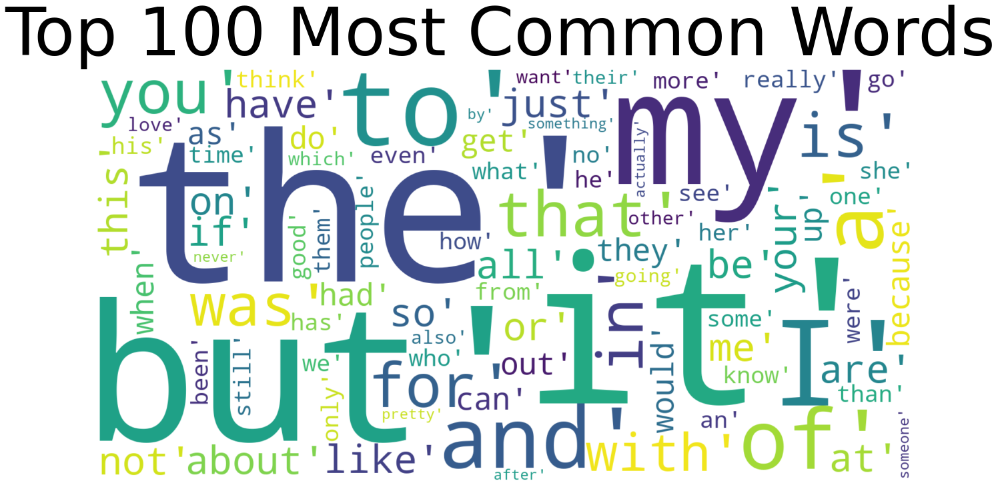

In [29]:
ESFJList = df5[df5['MBTI'] == 'ESFJ']['body']
wordcloud(ESFJList)

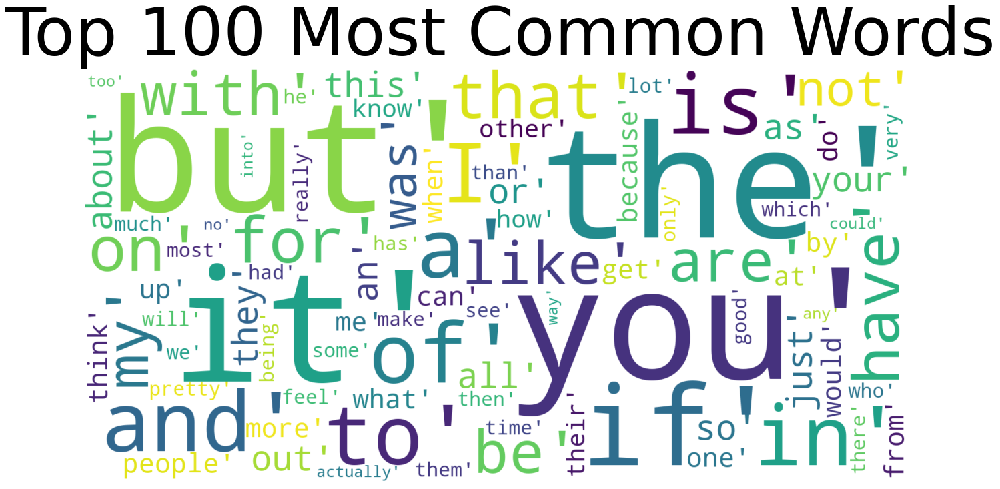

In [30]:
ESFPList = df5[df5['MBTI'] == 'ESFP']['body']
wordcloud(ESFPList)

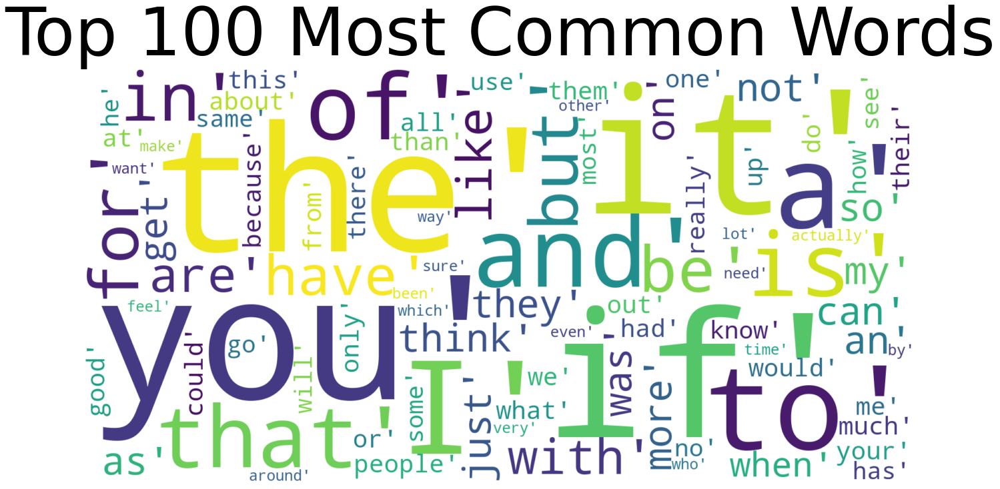

In [31]:
ESTJList = df5[df5['MBTI'] == 'ESTJ']['body']
wordcloud(ESTJList)

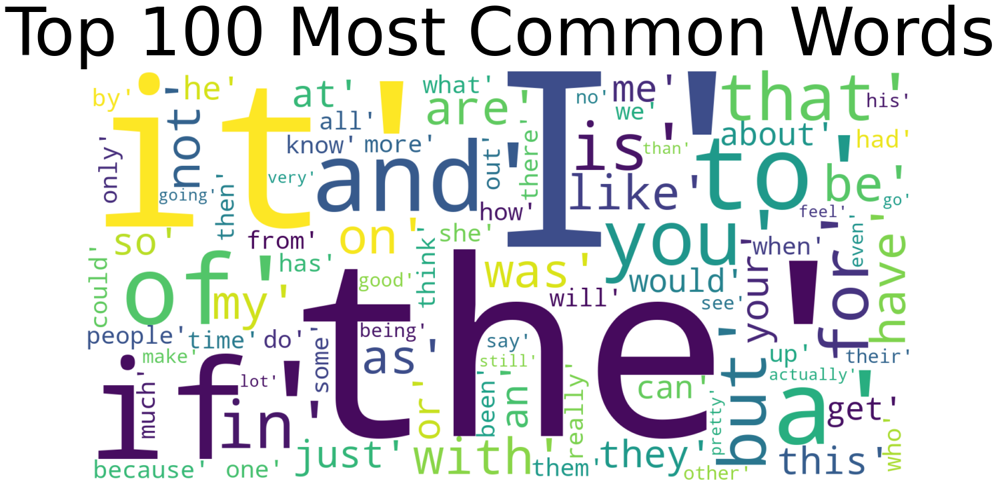

In [32]:
ESTPList = df5[df5['MBTI'] == 'ESTP']['body']
wordcloud(ESTPList)

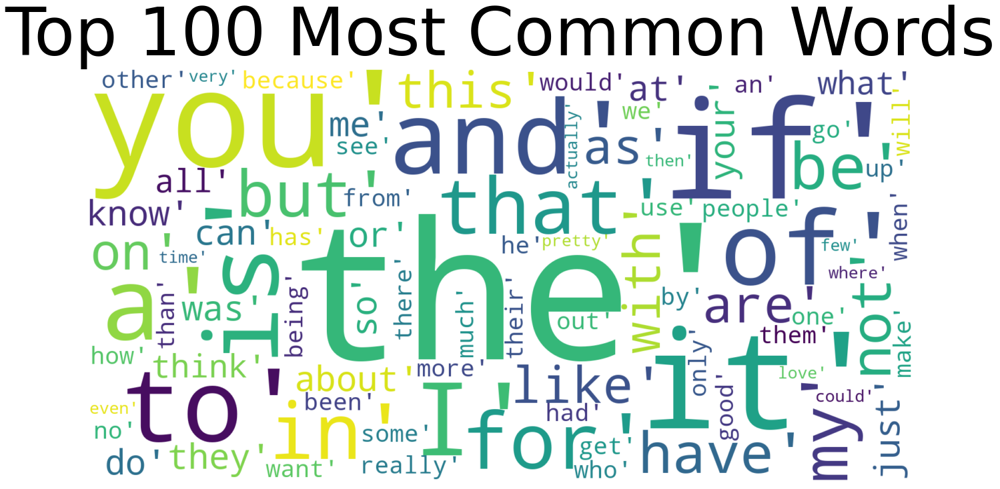

In [33]:
ENFJList = df5[df5['MBTI'] == 'ENFJ']['body']
wordcloud(ENFJList)

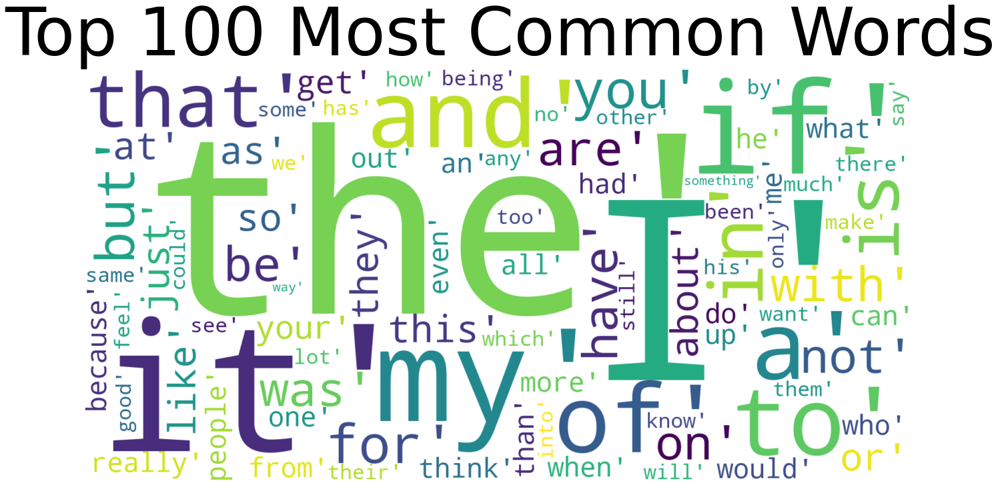

In [34]:
ENFPList = df5[df5['MBTI'] == 'ENFP']['body']
wordcloud(ENFPList)

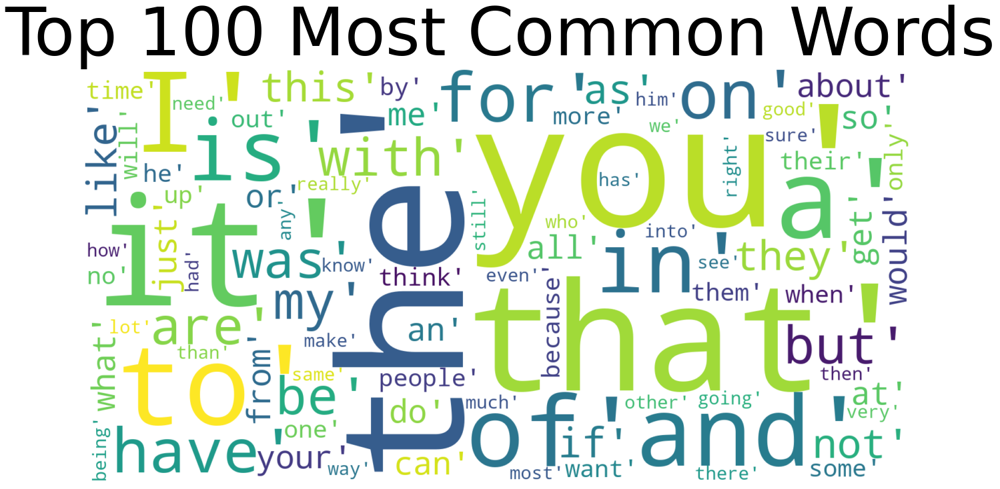

In [35]:
ENTJList = df5[df5['MBTI'] == 'ENTJ']['body']
wordcloud(ENTJList)

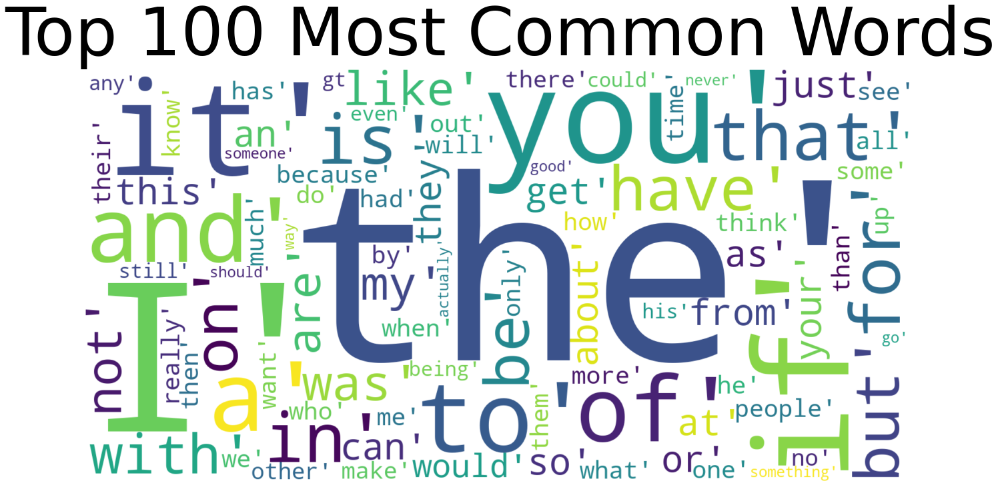

In [36]:
ENTPList = df5[df5['MBTI'] == 'ENTP']['body']
wordcloud(ENTPList)

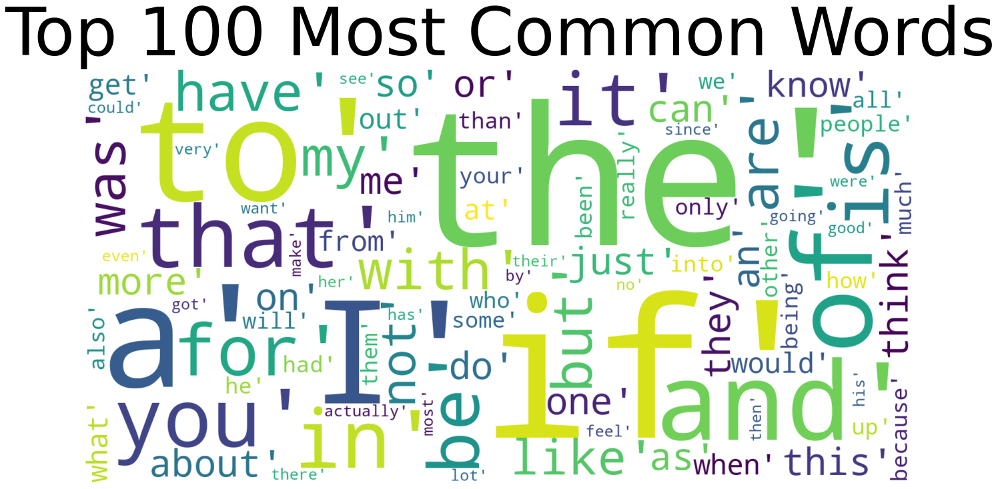

In [37]:
ISFJList = df5[df5['MBTI'] == 'ISFJ']['body']
wordcloud(ISFJList)

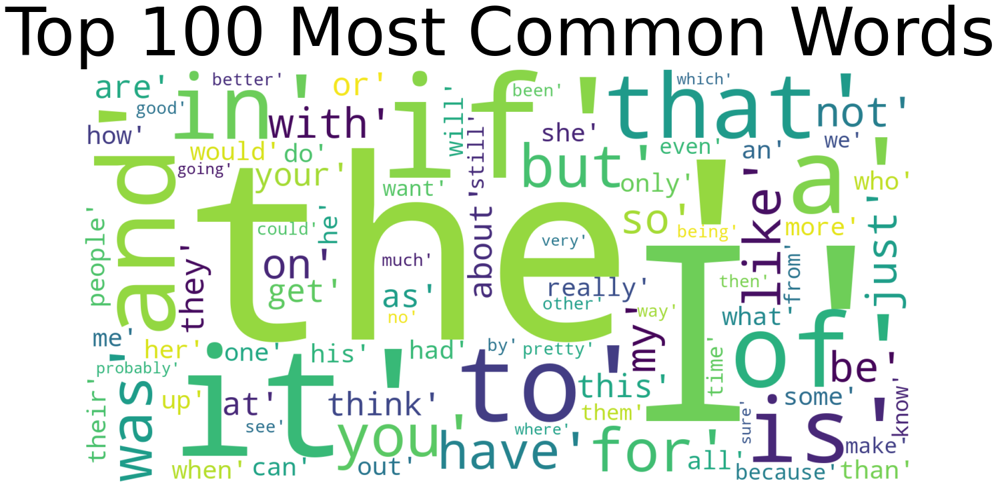

In [38]:
ISFPList = df5[df5['MBTI'] == 'ISFP']['body']
wordcloud(ISFPList)

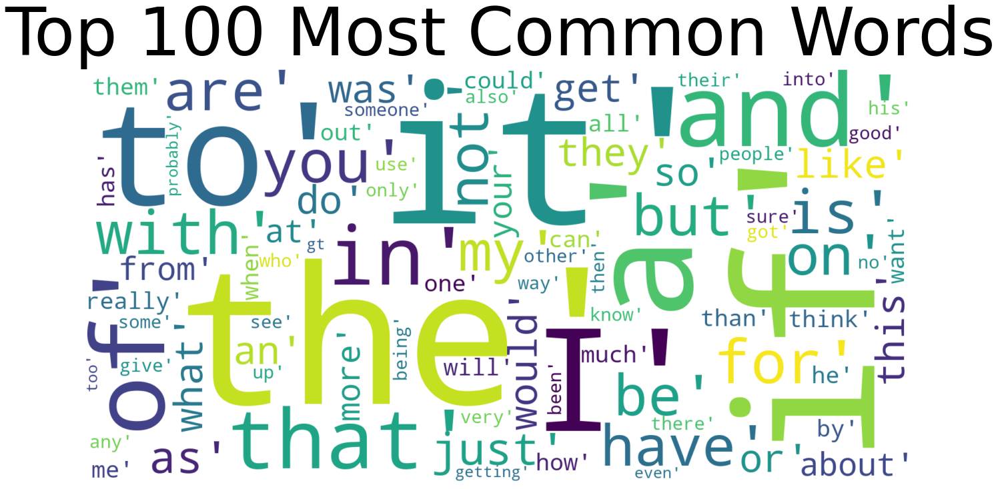

In [39]:
ISTJList = df5[df5['MBTI'] == 'ISTJ']['body']
wordcloud(ISTJList)

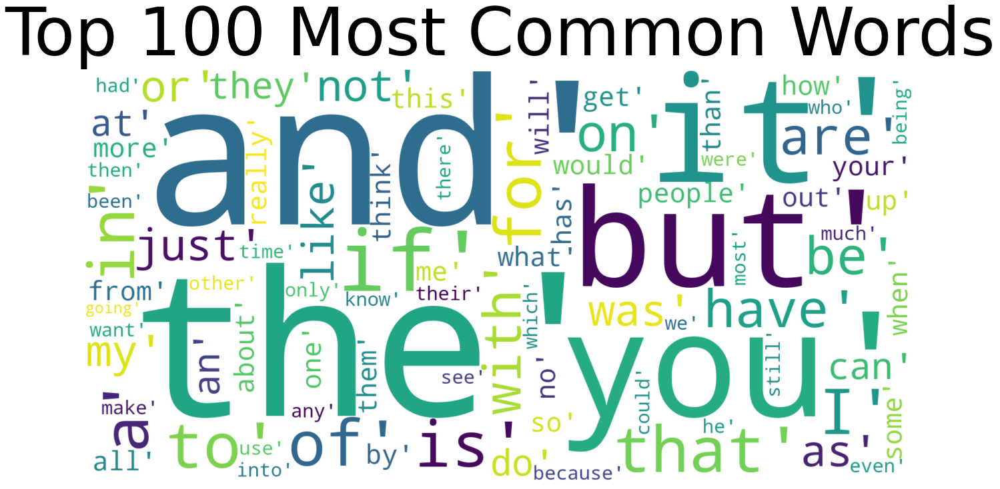

In [40]:
ISTPList = df5[df5['MBTI'] == 'ISTP']['body']
wordcloud(ISTPList)

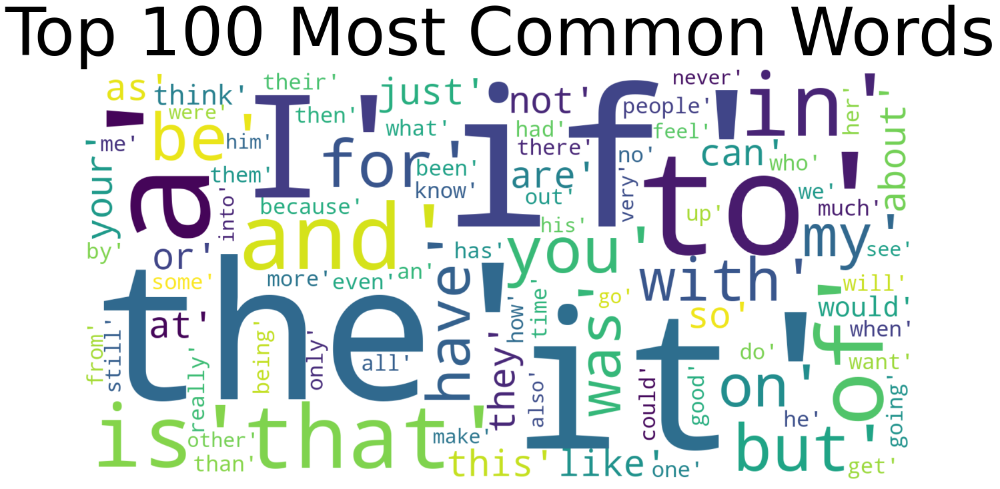

In [41]:
INFJList = df5[df5['MBTI'] == 'INFJ']['body']
wordcloud(INFJList)

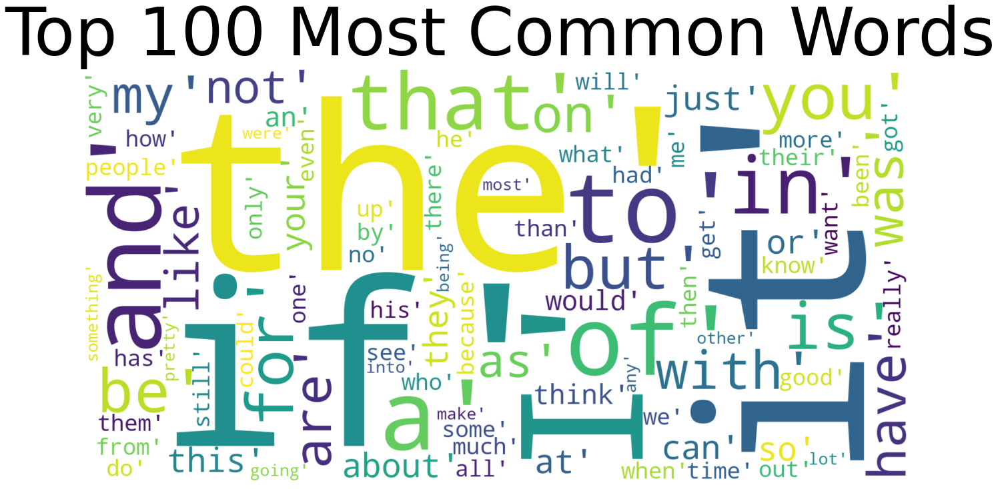

In [42]:
INFPList = df5[df5['MBTI'] == 'INFP']['body']
wordcloud(INFPList)

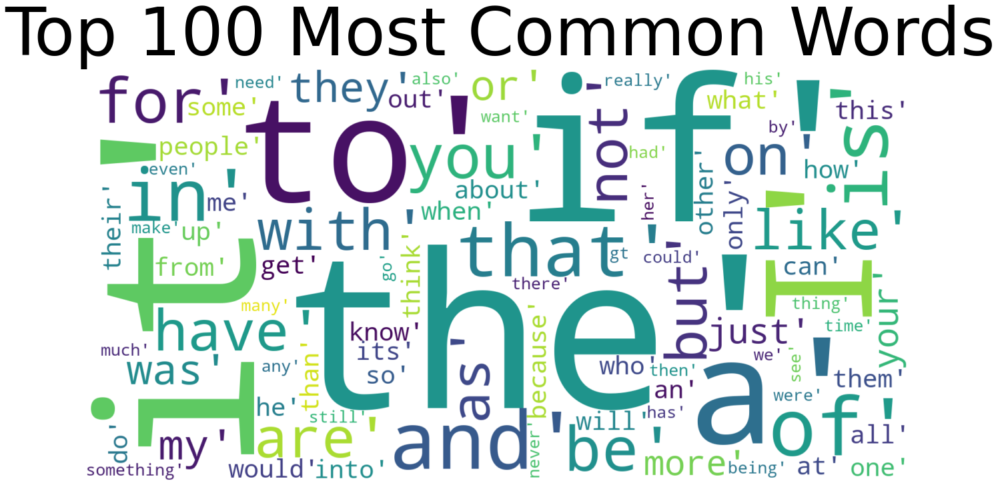

In [43]:
INTJList = df5[df5['MBTI'] == 'INTJ']['body']
wordcloud(INTJList)

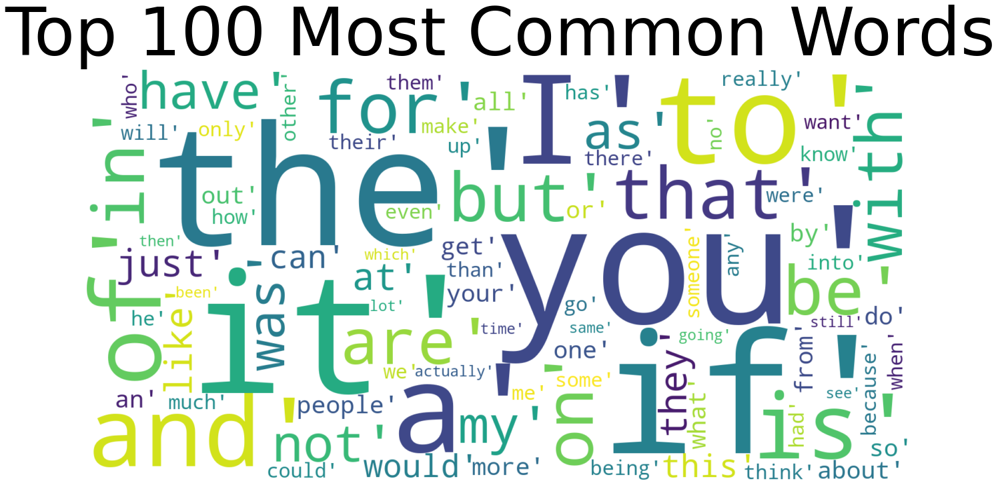

In [46]:
INTPList = df5[df5['MBTI'] == 'INTP']['body']
wordcloud(INTPList)

## Wordcloud by each attribute in MBTI 

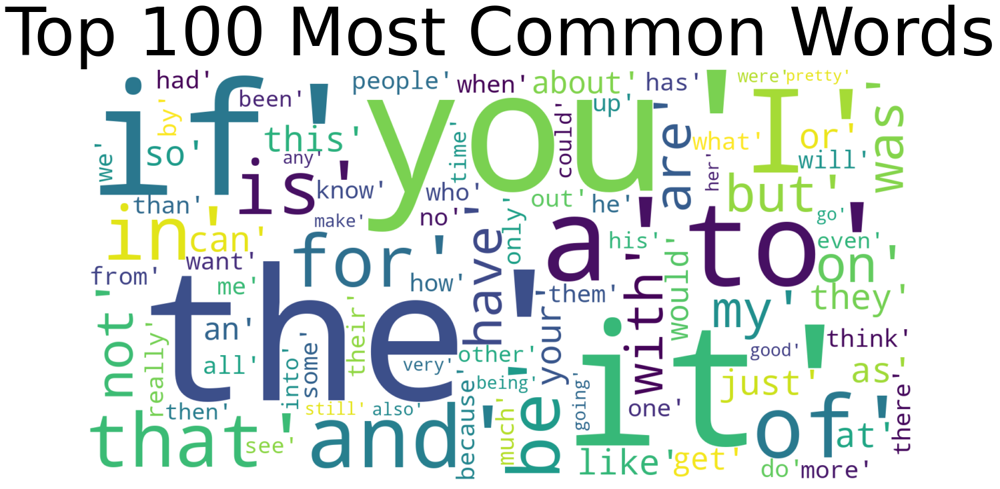

In [47]:
iList = df5[df5['E/I'] == 'I']['body']
wordcloud(iList)

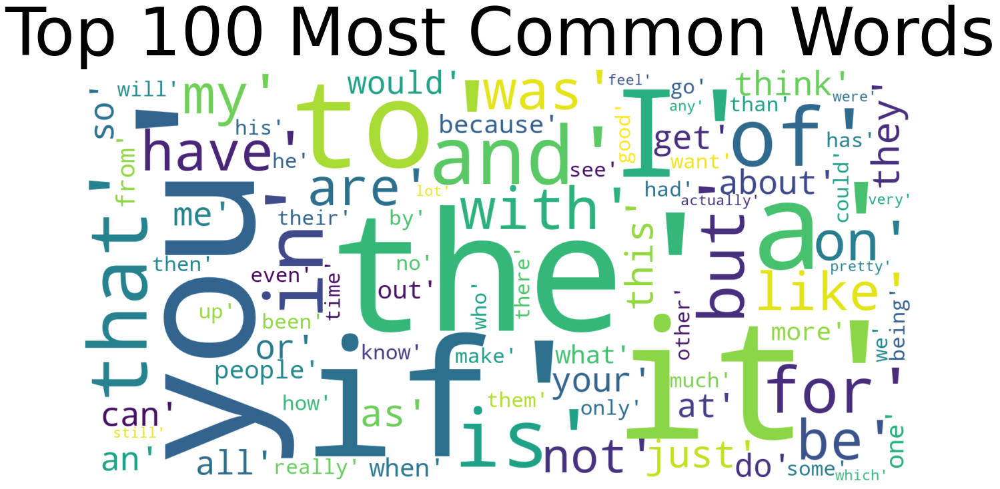

In [48]:
eList = df5[df5['E/I'] == 'E']['body']
wordcloud(eList)

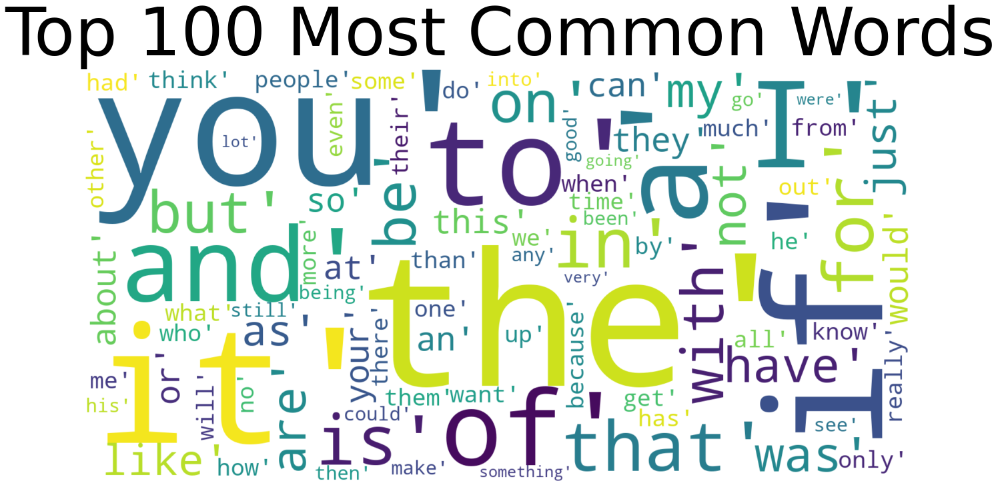

In [49]:
nList = df5[df5['N/S'] == 'N']['body']
wordcloud(nList)

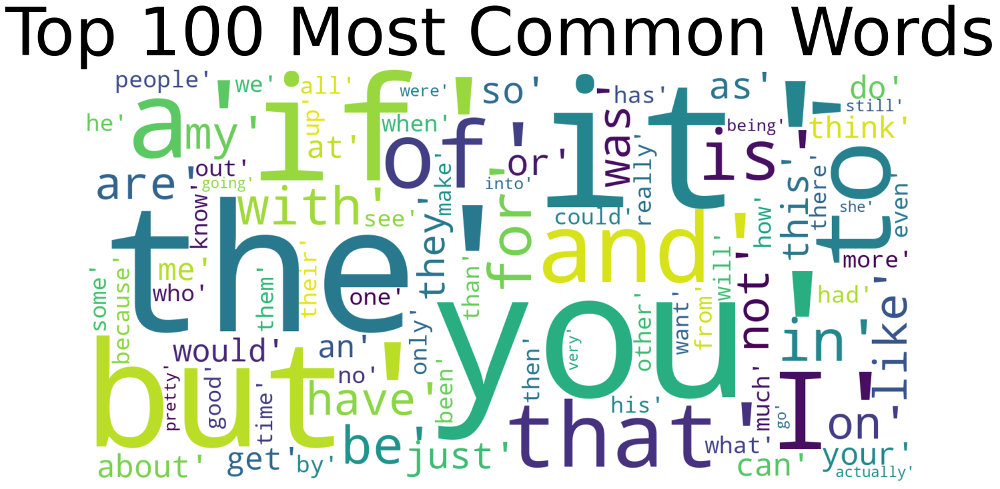

In [50]:
sList = df5[df5['N/S'] == 'S']['body']
wordcloud(sList)

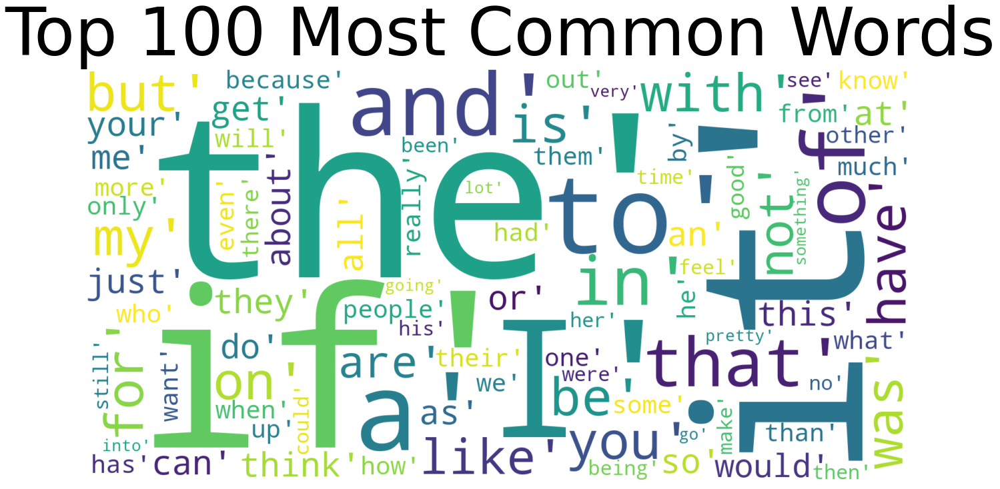

In [51]:
fList = df5[df5['F/T'] == 'F']['body']
wordcloud(fList)

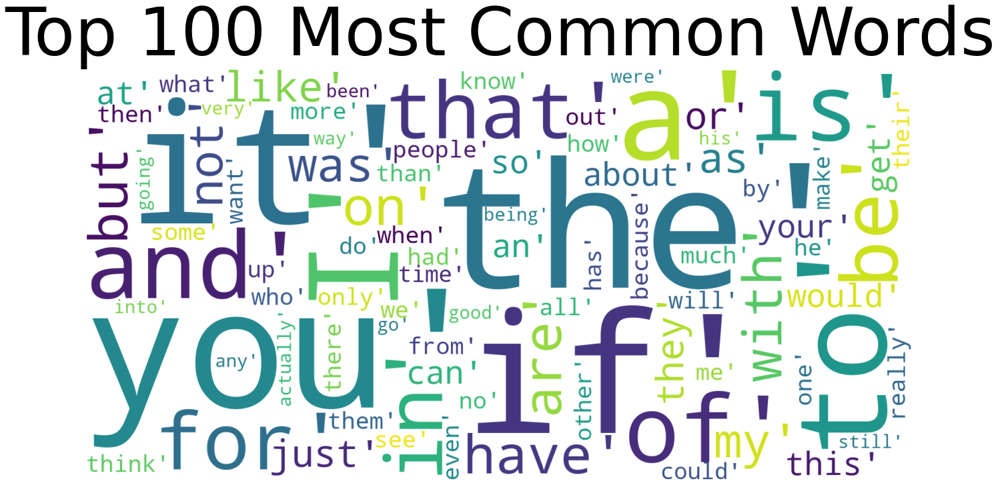

In [52]:
tList = df5[df5['F/T'] == 'T']['body']
wordcloud(tList)

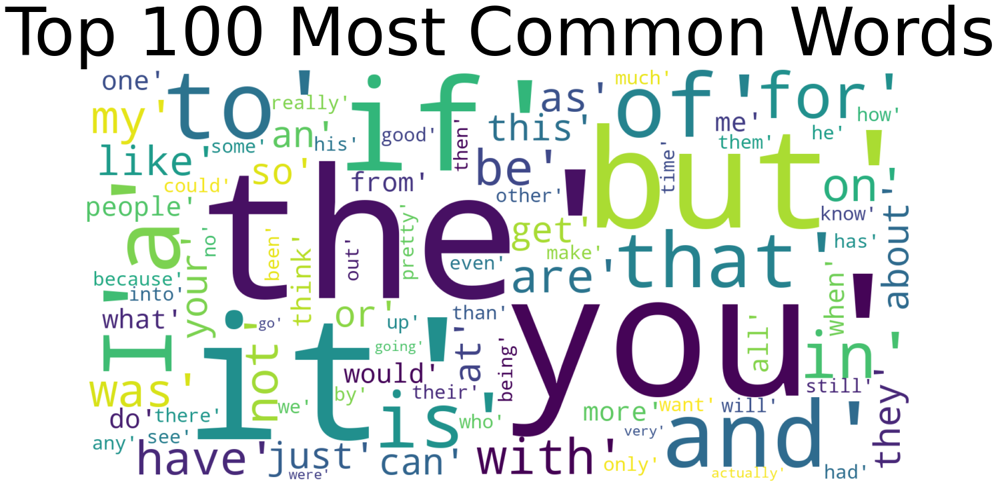

In [53]:
pList = df5[df5['P/J'] == 'P']['body']
wordcloud(pList)

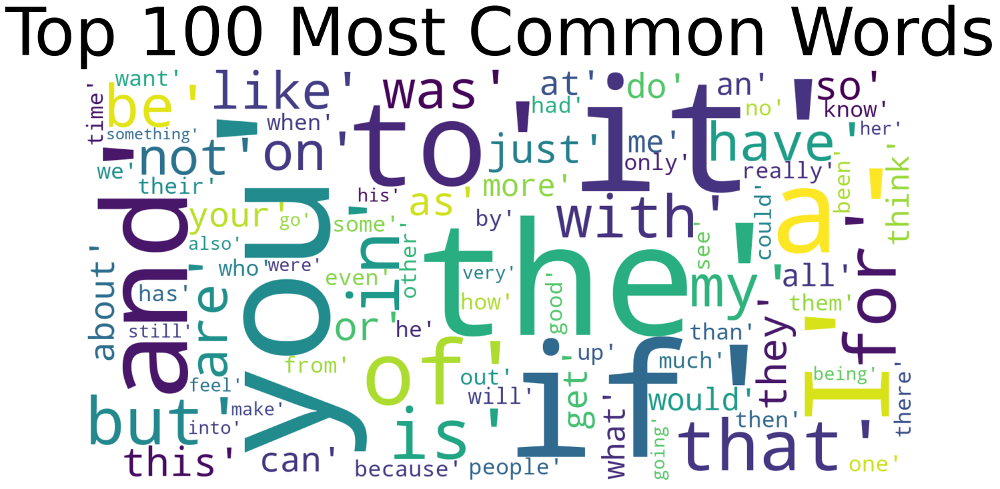

In [54]:
jList = df5[df5['P/J'] == 'J']['body']
wordcloud(jList)